# Hagar Shalabi 206002

##Importing all libraries to be used

In [ ]:
#!pip install opencv-python
#!pip install matplotlib
#!pip install pandas
#!pip install tqdm
#!pip install scipy
#!pip install sklearn
#!pip install --upgrade tensorflow
#!pip install h5py pyyaml
#!pip install tensorflow-gan
!pip install opendatasets
!pip install tensorflow-gan

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 367.1/367.1 KB 24.2 MB/s eta 0:00:00


In [ ]:
##IMPORTS
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import os
from tqdm import tqdm
import re
import cv2
import tensorflow as tf
import keras
from keras import layers
from keras.layers import MaxPool2D,Conv2D,UpSampling2D,Input,Dropout
from keras.models import Sequential
from keras.layers import Input, Dense
from keras.models import Model
#from keras.preprocessing.image import img_to_array
from tensorflow.keras.utils import img_to_array
from keras.layers import BatchNormalization
from keras.losses import categorical_crossentropy
from keras.optimizers import SGD, Adam
from keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Conv2D, MaxPooling2D
from keras.layers import Convolution2D as Conv2D
from numpy import expand_dims
from keras.preprocessing.image import ImageDataGenerator
import scipy
from sklearn.model_selection import train_test_split
from keras.callbacks import ModelCheckpoint, EarlyStopping
from keras.callbacks import TensorBoard
from sklearn.metrics import classification_report
from sklearn.model_selection import KFold

#FID score 
from numpy import cov
from numpy import trace
from numpy import iscomplexobj
from numpy import asarray
from numpy.random import shuffle
from scipy.linalg import sqrtm
from skimage.transform import resize
from numpy.random import random
import tensorflow_gan as tfgan

##Setup file with Colab

##### os library: function collection dealing with user's directories and their content interacting with the os
##### tqdm library: function library that tracks machine learning training by adding a progress bar representing data processing. 
##### re library: function library that checks if a string matches a given regular expression (re)
##### cv2 library: function library that solves computer vision (image-related) issues 
##### tensorflow library: function library for model tracking, performance monitoring, and model retraining.
##### keras libary:function collection for developing models

In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Mon Apr  3 03:46:58 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P0    47W / 400W |      0MiB / 40960MiB |      0%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Your runtime has 89.6 gigabytes of available RAM

You are using a high-RAM runtime!


## Getting the images as arrays

##### Dataset used: https://www.kaggle.com/datasets/theblackmamba31/landscape-image-colorization

In [ ]:
import opendatasets as od
od.download("https://www.kaggle.com/datasets/theblackmamba31/landscape-image-colorization/code?datasetId=1036526") #Subsection of ImageNet dataset
#name= hagarshalabi
#key= c6c64f26e19ffebd38a5985028002138

Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: hagarshalabi
Your Kaggle Key: ··········


100%|██████████| 192M/192M [00:10<00:00, 18.3MB/s]


In [ ]:
#Sorting Function: the RGB file images aligns with the greyscale file images 
def sorted_alphanumeric(data):  
    convert = lambda text: int(text) if text.isdigit() else text.lower()
    alphanum_key = lambda key: [convert(c) for c in re.split('([0-9]+)',key)]
    return sorted(data,key = alphanum_key)
#Setting all images to size=160 (rowsxcolumns) 
SIZE = 160

In [ ]:
#Converting all the RGB images in colour file into arrays 
RGB_img = []
path = '/content/landscape-image-colorization/landscape Images/color'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):     
    if i == '7120.jpg':
        break
    else:    
        img = cv2.imread(path + '/'+i,1)
        #CV2 converts BGR images to RGB 
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        #Resizing the RGB image by the set SIZE of 160
        img = cv2.resize(img, (SIZE, SIZE))
        #img now holds the resized RGB image, so array<--img
        img = img.astype('float32') / 255.0 
        RGB_img.append(img_to_array(img))

100%|█████████▉| 7120/7129 [00:06<00:00, 1136.09it/s]


In [ ]:
#Converting all the greyscale images in grey file into arrays similarly 
grey_img = []
path = '/content/landscape-image-colorization/landscape Images/gray'
files = os.listdir(path)
files = sorted_alphanumeric(files)
for i in tqdm(files):
    if i == '7120.jpg':
        break
    else:  
        img = cv2.imread(path + '/'+i,1)
        #Resizing the RGB image by the set SIZE of 160
        img = cv2.resize(img, (SIZE, SIZE))
        #img now holds the resized greyscale image, so array<--img
        img = img.astype('float32') / 255.0
        grey_img.append(img_to_array(img))

100%|█████████▉| 7120/7129 [00:04<00:00, 1450.61it/s]


## Quick Data Exploration

In [ ]:
# Output Function: Displays the RGB images (as arrays) with their corresponding greyscale images (as arrays)
def visualize(grey,RGB):
    fig = plt.figure()
    plt.subplot(1,2,1)
    plt.title('Original Image', color = 'red')
    plt.imshow(grey)

    plt.subplot(1,2,2)
    plt.title('Augmented image', color='black')
    plt.imshow(RGB)

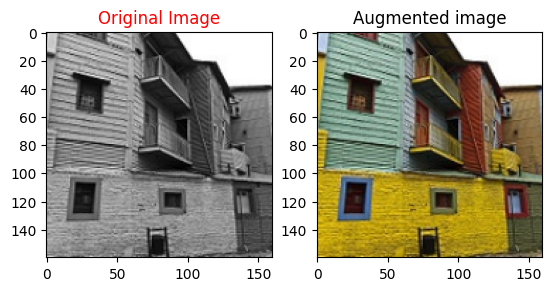

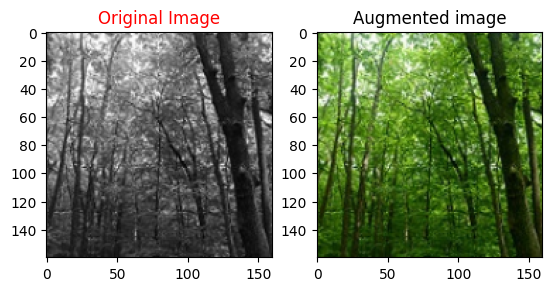

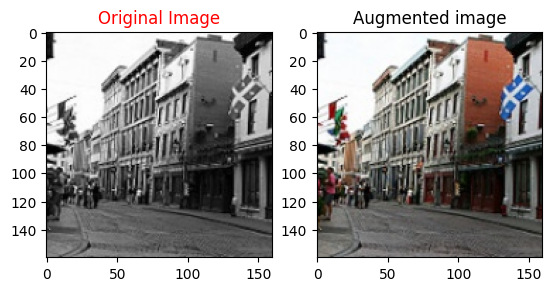

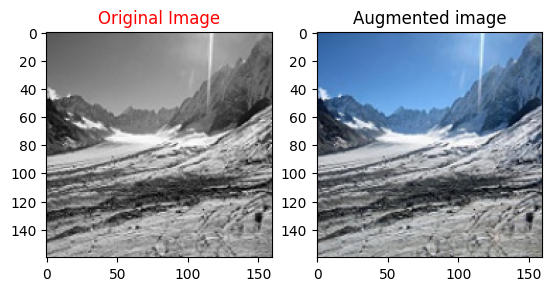

In [ ]:
for i in range(1,5):
     visualize(grey_img[i],RGB_img[i])

## Data Augementation 
### (the more training examples the dataset has, the more generalization the model would get)

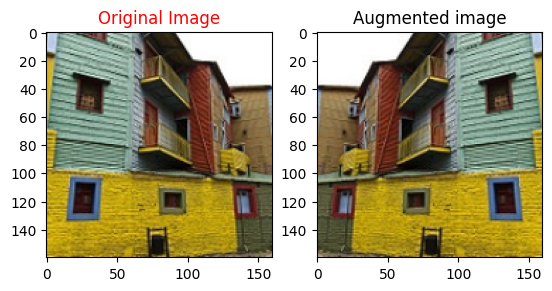

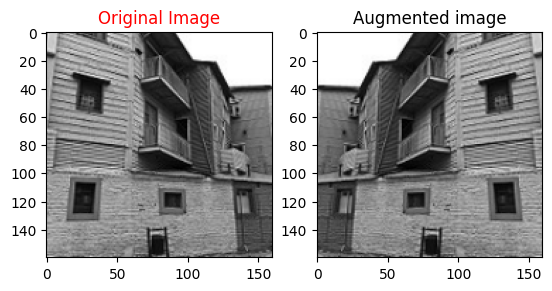

In [ ]:
#Data augementation of the RGB images & greyscale images (flipping horizontally)
x=len(RGB_img)
for i in range(x):
    RGB_img.append(img_to_array(tf.image.flip_left_right(RGB_img[i])))
    if i==1: visualize(RGB_img[i],tf.image.flip_left_right(RGB_img[i]))
  
    grey_img.append(img_to_array(tf.image.flip_left_right(grey_img[i])))
    if i==1: visualize(grey_img[i],tf.image.flip_left_right(grey_img[i]))

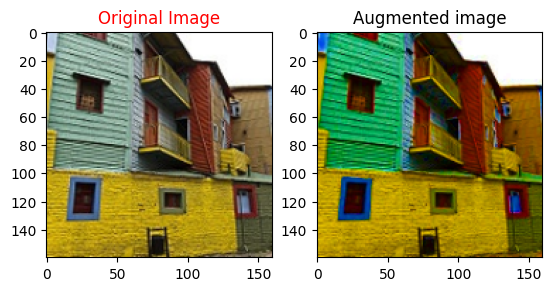

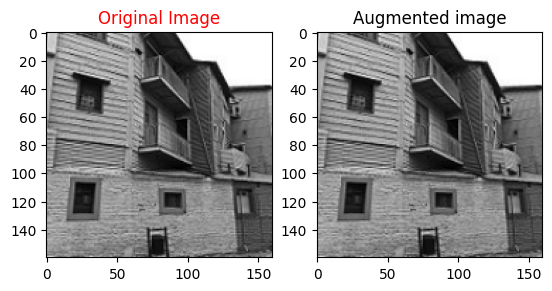

In [ ]:
#Data augementation of the RGB images & greyscale images (brightening+saturating)
x=len(RGB_img)
for i in range(x):
    RGB_img.append(img_to_array(tf.image.adjust_saturation(RGB_img[i], 5)))
    if i==1: visualize(RGB_img[i],tf.image.adjust_saturation(RGB_img[i], 5))

    grey_img.append(img_to_array(tf.image.adjust_saturation(grey_img[i], 5))) 
    if i==1: visualize(grey_img[i],tf.image.adjust_saturation(grey_img[i], 5))

## Creating a dataset

In [ ]:
#Concatening both the arrays into a dataset
RGB = pd.Series(RGB_img,name="RGB")
GREY = pd.Series(grey_img,name="GREY")
del RGB_img
del grey_img
data = pd.concat([GREY, RGB],axis=1)
data 

,GREY,RGB
0,"[[[0.38039216, 0.38039216, 0.38039216], [0.337...","[[[0.32941177, 0.3882353, 0.4627451], [0.28627..."
1,"[[[0.10980392, 0.10980392, 0.10980392], [0.870...","[[[0.078431375, 0.11764706, 0.16470589], [0.82..."
2,"[[[0.18431373, 0.18431373, 0.18431373], [0.580...","[[[0.078431375, 0.27450982, 0.0], [0.48235294,..."
3,"[[[0.101960786, 0.101960786, 0.101960786], [0....","[[[0.101960786, 0.101960786, 0.101960786], [0...."
4,"[[[0.33333334, 0.33333334, 0.33333334], [0.337...","[[[0.16862746, 0.3647059, 0.6039216], [0.17254..."
...,...,...
28475,"[[[0.3137255, 0.3137255, 0.3137255], [0.309803...","[[[0.0, 0.19411762, 0.64705884], [0.0, 0.19411..."
28476,"[[[0.99215686, 0.99215686, 0.99215686], [0.980...","[[[0.88235295, 1.0, 0.9607843], [0.87058824, 0..."
28477,"[[[0.61960787, 0.61960787, 0.61960787], [0.619...","[[[0.0, 0.34224603, 0.7529412], [0.0, 0.342246..."
28478,"[[[0.9019608, 0.9019608, 0.9019608], [0.901960...","[[[0.9019608, 0.9019608, 0.9019608], [0.901960..."


## Splitting dataset into training and testing sets 

In [ ]:
#Splitting data into train and test sets (80:20 respectively)
x_train = data['GREY'][:22784].tolist()
y_train = data['RGB'][:22784].tolist()
x_test = data['GREY'][22784:28480].tolist()
y_test = data['RGB'][22784:28480].tolist()
del data

In [ ]:
# Reshape train and test sets
x_train=np.reshape(x_train, (len(x_train), SIZE, SIZE, 3))
x_test=np.reshape(x_test, (len(x_test), SIZE, SIZE, 3))
y_train=np.reshape(y_train, (len(y_train), SIZE, SIZE, 3))
y_test=np.reshape(y_test, (len(y_test), SIZE, SIZE, 3))

In [ ]:
print('Train grey image shape:',x_train.shape)
print('Train color image shape:',y_train.shape)
print('Test grey image shape',x_test.shape)
print('Test color image shape',y_test.shape)

Train grey image shape: (22784, 160, 160, 3)
Train color image shape: (22784, 160, 160, 3)
Test grey image shape (5696, 160, 160, 3)
Test color image shape (5696, 160, 160, 3)


## Building optimum autoencoder-Sigmoid AF + Adam optimizer


In [ ]:
#CREATING DCAE

inputs = Input(shape=(SIZE, SIZE, 3))

# Encoder (compresses-downsamples) model
conv1 = Conv2D(64, (3, 3), activation='relu', padding='same')(inputs)
conv1 = BatchNormalization()(conv1)

conv2 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv1)
conv2 = BatchNormalization()(conv2)

conv3 = Conv2D(256, (3, 3), activation='relu', padding='same')(conv2)
conv3 = BatchNormalization()(conv3)

conv4 = Conv2D(512, (3, 3), activation='relu', padding='same')(conv3)
conv4 = BatchNormalization()(conv4)
pool4 = MaxPooling2D((2, 2))(conv4)


# Decoder (decompresses-upsamples) model

conv5 = Conv2D(512, (3, 3), activation='relu', padding='same')(pool4)
conv5 = BatchNormalization()(conv5)
up5= UpSampling2D((2, 2))(conv5)

conv6 = Conv2D(256, (3, 3), activation='relu', padding='same')(up5)
conv6 = BatchNormalization()(conv6)

conv7 = Conv2D(128, (3, 3), activation='relu', padding='same')(conv6)
conv7 = BatchNormalization()(conv7)

conv8 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv7)
conv8 = BatchNormalization()(conv8)

conv9 = Conv2D(64, (3, 3), activation='relu', padding='same')(conv8)
conv9 = BatchNormalization()(conv9)

# Output layer
output = Conv2D(3, (3, 3), activation='tanh', padding='same')(conv9)

# Define the model
model = Model(inputs=inputs, outputs=output)  

##Training and testing model

In [ ]:
#Training model
checkpoint_path = "path/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

# Create a callback that saves the model's weights
weights = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

model.compile(optimizer=tf.keras.optimizers.RMSprop(learning_rate=0.001),
              loss='mse',
              metrics=[tf.keras.metrics.Precision(), 
                       'accuracy'],
              run_eagerly=True)

model.fit(x_train, 
          y_train,
          verbose=False,
          epochs=45,
          validation_data=(x_test, y_test), 
          callbacks=[weights, 
                     keras.callbacks.TensorBoard("/tmp/tb_logs")])
del x_train
del y_train


Epoch 1: saving model to path/cp.ckpt

Epoch 2: saving model to path/cp.ckpt

Epoch 3: saving model to path/cp.ckpt

Epoch 4: saving model to path/cp.ckpt

Epoch 5: saving model to path/cp.ckpt

Epoch 6: saving model to path/cp.ckpt

Epoch 7: saving model to path/cp.ckpt

Epoch 8: saving model to path/cp.ckpt

Epoch 9: saving model to path/cp.ckpt

Epoch 10: saving model to path/cp.ckpt

Epoch 11: saving model to path/cp.ckpt

Epoch 12: saving model to path/cp.ckpt

Epoch 13: saving model to path/cp.ckpt

Epoch 14: saving model to path/cp.ckpt

Epoch 15: saving model to path/cp.ckpt

Epoch 16: saving model to path/cp.ckpt

Epoch 17: saving model to path/cp.ckpt

Epoch 18: saving model to path/cp.ckpt

Epoch 19: saving model to path/cp.ckpt

Epoch 20: saving model to path/cp.ckpt

Epoch 21: saving model to path/cp.ckpt

Epoch 22: saving model to path/cp.ckpt

Epoch 23: saving model to path/cp.ckpt

Epoch 24: saving model to path/cp.ckpt

Epoch 25: saving model to path/cp.ckpt

Epoch 26

In [ ]:
# Loads the weights
model.load_weights(checkpoint_path)
#Testing model
model.evaluate(x_test,  y_test, verbose=2)

178/178 - 18s - loss: 0.0338 - precision: 0.9472 - accuracy: 0.5732 - 18s/epoch - 103ms/step


[0.03377583995461464, 0.9472126960754395, 0.5731659531593323]

##Model Evaluation

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /tmp/tb_logs/

import IPython

display(IPython.display.HTML('''
<button id='open_tb'>Open TensorBoard</button> 
<button id='hide_tb'>Hide TensorBoard</button> 
<script>document.querySelector('#open_tb').onclick = () => { window.open(document.querySelector('iframe').src, "__blank") }
        document.querySelector('#hide_tb').onclick = () => { document.querySelector('iframe').style.display = "none" }</script>'''))

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
#Comparing the predictions to the inputs 
def plot_images(colour,greyscale,predicted):
    plt.figure(figsize=(15,15))
    plt.subplot(1,3,1)
    plt.title('RGB Image', color = 'pink', fontsize = 20)
    plt.imshow(colour)
    plt.subplot(1,3,2)
    plt.title('Greyscale Image ', color = 'black', fontsize = 20)
    plt.imshow(greyscale)
    plt.subplot(1,3,3)
    plt.title('Predicted Image ', color = 'Red', fontsize = 20)
    plt.imshow(predicted)
    plt.show()
predicted=[]
for i in range(1000):
    predicted.append(np.clip(model.predict(x_test[i].reshape(1,SIZE, SIZE,3)),0.0,1.0).reshape(SIZE, SIZE,3))
    if i<5: plot_images(y_test[i],x_test[i],predicted[i])

Output hidden; open in https://colab.research.google.com to view.

###Getting the PSNR and Consistency scores 

In [ ]:
#PSNR
cv2.PSNR(predicted[0], y_test[0])

63.923861600961054

In [ ]:
#Consistency (MSE)
from skimage.metrics import mean_squared_error
img1 = predicted[0].astype(np.float)
img2 = y_test[0].astype(np.float)
mse = mean_squared_error(img1, img2)
print(float(1 / (1 + mse))*100.)

97.43314738643025


<ipython-input-19-3596198511f9>:3: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img1 = predicted[0].astype(np.float)
<ipython-input-19-3596198511f9>:4: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  img2 = y_test[0].astype(np.float)


In [ ]:
# scale an array of images to a new size
def scale_images(images, new_shape):
 images_list = list()
 for image in images:
 # resize with nearest neighbor interpolation
  new_image = resize(image, new_shape, 0)
 # store
  images_list.append(new_image)
 return asarray(images_list)
 

def calculate_fid(images1, images2, eps=1):
    mu1 = np.mean(images1, axis=0)
    mu2 = np.mean(images2, axis=0)
    sigma1 = np.cov(images1,rowvar=False)
    sigma2 = np.cov(images2,rowvar=False)

    # Calculate the trace of the product of covariance matrices
    cov_mean = sqrtm(sigma1.dot(sigma2))

    # Check for imaginary components and discard them
    if np.iscomplexobj(cov_mean):
        cov_mean = cov_mean.real

    # Calculate the squared Frobenius norm between the means and the covariance
    fid_score = np.sum((mu1 - mu2)**2) + np.trace(sigma1 + sigma2 - 2*cov_mean)

    return fid_score
 
# resize images
test=y_test[:1000]
images1 = scale_images(test, (SIZE,SIZE,3))
images2 = scale_images(predicted, (SIZE,SIZE,3))
print('Scaled', images1.shape, images2.shape)

# calculate fid
# define two collections of activation
images1 = np.reshape(images1,(19200, 4000))
images2 = np.reshape(images2,(19200, 4000))

print('FID: %.3f' % calculate_fid(images1, images2))

Scaled (1000, 160, 160, 3) (1000, 160, 160, 3)
FID: 65.660


##Enhancements to the predictions 

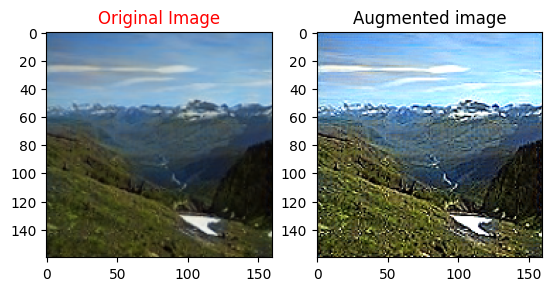

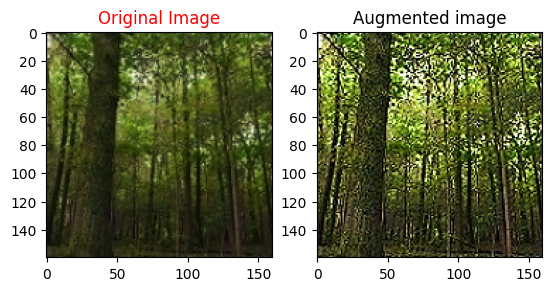

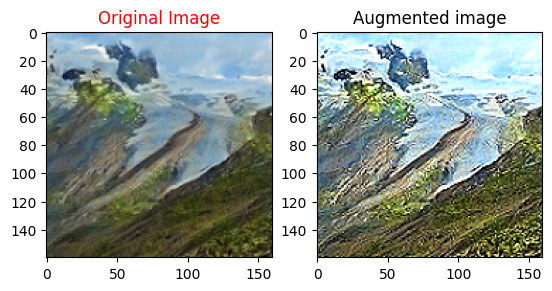

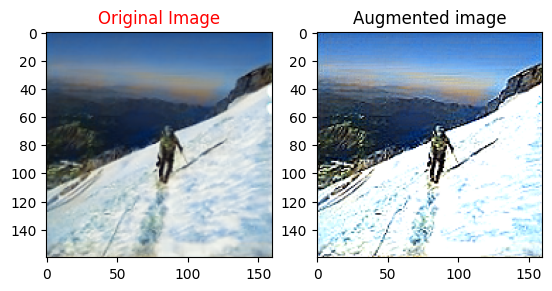

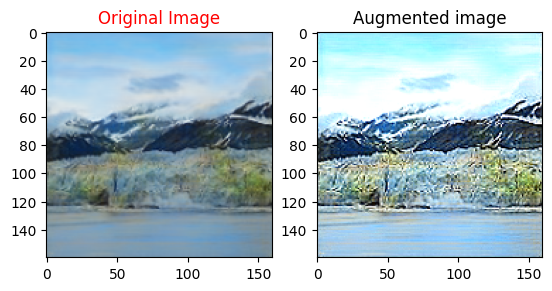

In [ ]:
#After enhancements *brightening + sharpening*
enhance=[]
for i in range(0,5):
    # create a sharpening kernel
    laplace=np.array([[0,-1,0],
                 [-1,5.3,-1],
                [0,-1,0]])
    enhance.append(cv2.filter2D(predicted[i],-1, laplace))
    visualize(predicted[i],enhance[i])